In [ ]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = '/content/drive/MyDrive/kaggle competitions'

In [ ]:
!kaggle datasets download -d preetviradiya/cezanne-to-photo-gan-dataset

 94% 252M/267M [00:02<00:00, 101MB/s] 
100% 267M/267M [00:02<00:00, 94.0MB/s]


In [ ]:
!unzip -q /content/cezanne-to-photo-gan-dataset.zip

In [ ]:
import torch
import torch.nn as nn
from torch.nn.utils import clip_grad_norm_
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as tt
from torchvision.utils import make_grid

import time
from tqdm.notebook import tqdm
from PIL import Image

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
seed = 322
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.backends.cudnn.determenistic = True

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [ ]:
data_dir = '/content/cezanne2photo/cezanne2photo'
os.listdir(data_dir)

['testA', 'testB', 'trainA', 'trainB']

In [ ]:
len(os.listdir(os.path.join(data_dir, 'trainA'))), len(os.listdir(os.path.join(data_dir, 'trainB')))

(525, 6287)

In [ ]:
len(os.listdir(os.path.join(data_dir, 'testA'))), len(os.listdir(os.path.join(data_dir, 'testB')))

(58, 751)

In [ ]:
class ImageDataset(Dataset):
  def __init__(self, data_dir, test=False, tfms=None):
    super(ImageDataset, self).__init__()
    if test:
      dir_a = os.path.join(data_dir, 'testA')
      dir_b = os.path.join(data_dir, 'testB')
    else:
      dir_a = os.path.join(data_dir, 'trainA')
      dir_b = os.path.join(data_dir, 'trainB')

    self.files_a = [os.path.join(dir_a, name) for name in sorted(os.listdir(dir_a))]
    self.files_b = [os.path.join(dir_b, name) for name in sorted(os.listdir(dir_b))]
    self.tfms = tfms

  def __len__(self):
    return len(self.files_a)

  def __getitem__(self, index):
    random_index = np.random.randint(0, len(self.files_a))
    file_a = Image.open(self.files_a[index])
    file_b = Image.open(self.files_b[random_index])
    if self.tfms is not None:
      file_a = self.tfms(file_a)
      file_b = self.tfms(file_b)
    return file_a, file_b

In [ ]:
stats = ((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
train_tfms = tt.Compose([tt.Resize(256),
                         tt.RandomHorizontalFlip(p=0.5),
                         tt.RandomVerticalFlip(p=0.2),
                         tt.CenterCrop(256),
                         tt.ToTensor(),
                         tt.Lambda(lambda x: x.repeat(3, 1, 1) if x.shape[0] == 1 else x),
                         tt.Normalize(*stats),
                         tt.RandomErasing(p=0.2)])
test_tfms = tt.Compose([tt.Resize(256), tt.ToTensor(),
                        tt.Lambda(lambda x: x.repeat(3, 1, 1) if x.shape[0] == 1 else x), tt.Normalize(*stats)])

In [ ]:
train_ds = ImageDataset(data_dir, test=False, tfms=train_tfms)
test_ds = ImageDataset(data_dir, test=True, tfms=test_tfms)

In [ ]:
batch_size = 5
train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=4, pin_memory=True)
test_dl = DataLoader(test_ds, batch_size, num_workers=4, pin_memory=True)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:566: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
def denorm(img, mean=0.5, std=0.5):
  return img * std + mean

In [ ]:
def unnorm(img, mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]):
  for i, m, s in zip(img, mean, std):
    i.mul_(s).sum(m)
  return img

In [ ]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=0,
                 transpose=False, leaky=True, normalize=True, dropout=False):
        super(ConvBlock, self).__init__()

        self.block = []
        if transpose:
            self.block += [nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, output_padding=1)]
        else:
            self.block += [nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, padding_mode='reflect')]
        if leaky:
            self.block += [nn.LeakyReLU(negative_slope=0.2, inplace=True)]
        else:
            self.block += [nn.ReLU(inplace=True)]
        if normalize:
            self.block += [nn.InstanceNorm2d(out_channels)]
        if dropout:
            self.block += [nn.Dropout(p=0.5)]
        self.block = nn.Sequential(*self.block)

    def forward(self, x):
        return self.block(x)

class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.ReflectionPad2d(1),
            ConvBlock(channels, channels, kernel_size=3, dropout=True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(channels, channels, kernel_size=3),
            nn.InstanceNorm2d(channels))

    def forward(self, x):
        return self.block(x) + x

In [ ]:
class Generator(nn.Module):
    def __init__(self, in_channels: int=3, out_channels: int=3, num_residual_blocks: int=7):
        super(Generator, self).__init__()
        '''Encoder'''
        # Initial: 3 x 256 x 256 -> 64 x 256 x 256
        self.initial = nn.Sequential(
            nn.ReflectionPad2d(in_channels),
            ConvBlock(in_channels, 64, 2*in_channels+1, normalize=False))
        # Downsampling: 64 x 256 x 256 -> 128 x 128 x 128 -> 256 x 64 x 64 -> 512 x 32 x 32 -> 1024 x 16 x 16
        self.down = nn.Sequential(
            ConvBlock(64, 128, kernel_size=4, stride=2, padding=1, dropout=True),
            ConvBlock(128, 256, kernel_size=4, stride=2, padding=1),
            ConvBlock(256, 512, kernel_size=4, stride=2, padding=1),
            #ConvBlock(512, 1024, kernel_size=4, stride=2, padding=1)
        )
        '''Transformer'''
        self.transform = []
        self.transform += [ConvBlock(512, 512, kernel_size=3, stride=1, padding=1, dropout=True)]
        self.transform += [ResidualBlock(512) for _ in range(num_residual_blocks)]
        self.transform += [ConvBlock(512, 512, kernel_size=3, stride=1, padding=1, dropout=True)]
        self.transform = nn.Sequential(*self.transform)
        '''Decoder'''
        # Upsampling: 1024 x 16 x 16 -> 512 x 32 x 32 -> 256 x 64 x 64 -> 128 x 128 x 128 -> 64 x 256 x 256
        self.up = nn.Sequential(
            #ConvBlock(1024, 512, kernel_size=3, stride=2, padding=1, transpose=True),
            ConvBlock(512, 256, kernel_size=3, stride=2, padding=1, transpose=True),
            ConvBlock(256, 128, kernel_size=3, stride=2, padding=1, transpose=True),
            ConvBlock(128, 64, kernel_size=3, stride=2, padding=1, transpose=True, dropout=True))
        # Out layer: 64 x 256 x 256 -> 3 x 256 x 256
        self.out = nn.Sequential(
            nn.ReflectionPad2d(out_channels),
            ConvBlock(64, out_channels, kernel_size=2*out_channels+1, leaky=False),
            nn.Tanh())
    def forward(self, x):
        x = self.down(self.initial(x))
        x = self.transform(x)
        x = self.out(self.up(x))
        return x

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, in_channels: int=3, sigmoid: bool=False):
        super(Discriminator, self).__init__()
        self.model = [
            # 3 x 256 x 256 -> 64 x 128 x 128
            ConvBlock(3, 64, kernel_size=4, stride=2, padding=1, normalize=False),
            # 64 x 128 x 128 -> 128 x 64 x 64
            ConvBlock(64, 128, kernel_size=4, stride=2, padding=1, dropout=True),
            # 128 x 64 x 64 -> 256 x 32 x 32
            ConvBlock(128, 256, kernel_size=4, stride=2, padding=1),
            # 256 x 32 x 32 -> 512 x 16 x 16
            ConvBlock(256, 512, kernel_size=4, stride=2, padding=1),
            # 512 x 16 x 16 -> 1024 x 8 x 8
            ConvBlock(512, 1024, kernel_size=4, stride=2, padding=1),
            # 1024 x 8 x 8 -> 1024 x 4 x 4
            ConvBlock(1024, 1024, kernel_size=4, stride=2, padding=1, normalize=False, dropout=True),
            # 1024 x 4 x 4 -> 1 x 1 x 1
            nn.Conv2d(1024, 1, kernel_size=4, stride=1, padding=0)
        ]
        if sigmoid: self.model += [nn.Sigmoid()]
        else: self.model += [nn.ReLU()]
        self.model = nn.Sequential(*self.model)
    def forward(self, x):
        return self.model(x)

In [ ]:
generator_cezanne2photo = Generator().to(device)
generator_photo2cezanne = Generator().to(device)

discriminator_cezanne = Discriminator(in_channels=3, sigmoid=True).to(device)
discriminator_photo = Discriminator(in_channels=3, sigmoid=True).to(device)

In [ ]:
class Buffer():
    def __init__(self, max_images: int=50):
        self.max_images = max_images
        self.images = []
    def update(self, images):
        images = images.detach().cpu().data.numpy()
        for image in images:
            if len(self.images) < self.max_images:
                self.images.append(image)
        else:
            if np.random.rand() > 0.5:
                index = np.random.randint(0, len(self.images))
                self.images[index] = image
    def sample(self, n_images):
        samples = np.array([self.images[np.random.randint(0, len(self.images))] for _ in range(n_images)])
        return torch.tensor(samples)

In [ ]:
class History():
    def __init__(self):
        self.losses_g = []
        self.losses_d = []
        self.lrs = []
    def update_losses(self, loss_g, loss_d):
        self.losses_g.append(loss_g)
        self.losses_d.append(loss_d)
    def update_lrs(self, lr):
        self.lrs.append(lr)
    def plot_losses(self):
        plt.figure(figsize=(20, 9))
        plt.plot(self.losses_g, '-o', linewidth=2, markersize=3, label='Generator loss', c='r')
        plt.plot(self.losses_d, '-x', linewidth=2, markersize=3, label='Discriminator loss', c='g')
        plt.title('Losses x Epoch N.')
        plt.xlabel('Epoch')
        plt.ylabel('MSE score')
        plt.grid(True)
        plt.legend(loc='best')
        plt.show();
    def plot_lrs(self):
        plt.figure(figsize=(20, 9))
        plt.plot(self.lrs)
        plt.title('Learning rate x Batch N.')
        plt.xlabel('Batch')
        plt.ylabel('Learning rate')
        plt.grid(True)
        plt.show();

In [ ]:
criterion_GAN = nn.MSELoss()
criterion_cycle = nn.MSELoss()
criterion_identity = nn.MSELoss()

In [ ]:
def update_req_grad(models, req_grad=False):
    for model in models:
        for param in model.parameters():
            param.requires_grad = req_grad

In [ ]:
def get_lr(opt):
    for param_group in opt.param_groups:
        return param_group["lr"]

In [ ]:
def train_generators(real_a, real_b,
                     generator_a2b, generator_b2a,
                     discriminator_a, discriminator_b,
                     buffer_a, buffer_b):
    # forward-pass

    fake_a = generator_b2a(real_b)
    fake_b = generator_a2b(real_a)

    cycle_a = generator_b2a(fake_b)
    cycle_b = generator_a2b(fake_a)

    identity_a = generator_b2a(real_a)
    identity_b = generator_a2b(real_b)

    # buffer update
    buffer_a.update(fake_a)
    buffer_b.update(fake_b)

    # discriminator outputs that are used in adversarial loss
    discriminator_outputs_a = discriminator_a(fake_a)
    discriminator_outputs_b = discriminator_b(fake_b)

    # labels
    labels_real = torch.ones(discriminator_outputs_a.size()).to(device)
    labels_fake = torch.zeros(discriminator_outputs_a.size()).to(device)

    # losses
    loss_GAN_b2a = criterion_GAN(discriminator_outputs_a, labels_real)
    loss_GAN_a2b = criterion_GAN(discriminator_outputs_b, labels_real)
    loss_GAN = (loss_GAN_b2a + loss_GAN_a2b) / 2

    loss_cycle_a = criterion_cycle(cycle_a, real_a)
    loss_cycle_b = criterion_cycle(cycle_b, real_b)
    loss_cycle = (loss_cycle_a + loss_cycle_b) / 2

    loss_identity_a = criterion_identity(identity_a, real_a)
    loss_identity_b = criterion_identity(identity_b, real_b)
    loss_identity = (loss_identity_a + loss_identity_b) / 2

    loss_generators_total = loss_GAN + 9 * loss_cycle + 4 * loss_identity

    return loss_generators_total

In [ ]:
def train_discriminators(real_a, real_b, buffer_a, buffer_b, discriminator_a, discriminator_b):
    fake_a = buffer_a.sample(n_images=real_a.shape[0]).to(device)
    fake_b = buffer_b.sample(n_images=real_b.shape[0]).to(device)

    # noisy labels for discriminators
    noisy_labels_real = (torch.rand(torch.Size([batch_size, 1, 1, 1])) < 0.85).float().to(device)
    labels_fake = torch.zeros(torch.Size([batch_size, 1, 1, 1])).to(device)
    # forward pass
    loss_real_a = criterion_GAN(discriminator_a(real_a), noisy_labels_real)
    loss_fake_a = criterion_GAN(discriminator_a(fake_a.detach()), labels_fake)
    loss_a = (loss_real_a + loss_fake_a) / 2

    loss_real_b = criterion_GAN(discriminator_b(real_b), noisy_labels_real)
    loss_fake_b = criterion_GAN(discriminator_b(fake_b.detach()), labels_fake)
    loss_b = (loss_real_b + loss_fake_b) / 2

    loss_discriminators_total = loss_a + loss_b

    return loss_discriminators_total

In [ ]:
def epoch_end(epoch, loss_g, loss_d, last_lr, buffer_a, buffer_b, time_epoch, test_dl, generator_b2a, generator_a2b, show_b2a=True, show_a2b=False):
    print("Epoch: %d/%d | Generators Loss: %.4f | Discriminators Loss: %.4f | Last lr %.8f | It took %.3f mins"
              % (epoch+1, num_epochs, loss_g, loss_d, last_lr, time_epoch))
    if (epoch+1) % 5 == 0:
        real_a, real_b = next(iter(test_dl))
        if show_b2a:
            sample_fake_a = generator_b2a(real_b.to(device)).detach().cpu()
            num_photos = min(batch_size, 5)
            print('B -> A')
            plt.figure(figsize=(20, 8))
            for k in range(num_photos):
                plt.subplot(2, num_photos, k + 1)
                plt.imshow(denorm(real_b[k]).permute(1, 2, 0))
                plt.title('Input photo')
                plt.axis('off')

                plt.subplot(2, num_photos, k + num_photos + 1)
                plt.imshow(denorm(sample_fake_a[k]).permute(1, 2, 0))
                plt.title('Output image')
                plt.axis('off')
            plt.show()
        if show_a2b:
            sample_fake_b = generator_a2b(real_a.to(device)).detach().cpu()
            num_photos = min(batch_size, 5)
            print('A -> B')
            plt.figure(figsize=(20, 8))
            for k in range(num_photos):
                plt.subplot(2, num_photos, k + 1)
                plt.imshow(denorm(real_a[k]).permute(1, 2, 0))
                plt.title('Input image')
                plt.axis('off')

                plt.subplot(2, num_photos, k + num_photos + 1)
                plt.imshow(denorm(sample_fake_b[k]).permute(1, 2, 0))
                plt.title('Output photo')
                plt.axis('off')
            plt.show()

In [ ]:
def fit(num_epochs, train_dl, test_dl,
        generator_a2b, generator_b2a,
        discriminator_a, discriminator_b,
        lr, buffer_a, buffer_b, history, save=False):
    torch.cuda.empty_cache()
    time_training_start = time.perf_counter()
    '''Optimizers'''
    b1 = 0.5
    b2 = 0.999
    optim_generators = torch.optim.Adam(
        list(generator_cezanne2photo.parameters()) + list(generator_photo2cezanne.parameters()),
        lr=lr, betas=(b1, b2))
    optim_discriminators = torch.optim.Adam(
        list(discriminator_cezanne.parameters()) + list(discriminator_photo.parameters()),
        lr=lr, betas=(b1, b2))
    '''Schedulers'''
    lr_sched_generators = torch.optim.lr_scheduler.OneCycleLR(optim_generators, max_lr=lr,
                                                              epochs=num_epochs, steps_per_epoch=len(train_dl))
    lr_sched_discriminators = torch.optim.lr_scheduler.OneCycleLR(optim_discriminators, max_lr=lr,
                                                              epochs=num_epochs, steps_per_epoch=len(train_dl))

    for epoch in range(num_epochs):
        time_start_epoch = time.perf_counter()
        avg_g_loss = 0
        avg_d_loss = 0
        last_lr = 0

        for real_a, real_b in tqdm(train_dl, leave=False):
            real_a, real_b = real_a.to(device), real_b.to(device)

            update_req_grad([generator_a2b, generator_b2a], req_grad=True)
            update_req_grad([discriminator_a, discriminator_b], req_grad=False)
            torch.cuda.empty_cache()
            optim_generators.zero_grad()

            loss_g = train_generators(real_a, real_b, generator_a2b, generator_b2a,
                                      discriminator_a, discriminator_b, buffer_a, buffer_b)
            loss_g.backward()
            optim_generators.step()
            clip_grad_norm_(generator_a2b.parameters(), 100)
            clip_grad_norm_(generator_b2a.parameters(), 100)

            update_req_grad([generator_a2b, generator_b2a], req_grad=False)
            update_req_grad([discriminator_a, discriminator_b], req_grad=True)
            torch.cuda.empty_cache()
            optim_discriminators.zero_grad()
            loss_d = train_discriminators(real_a, real_b, buffer_a, buffer_b, discriminator_a, discriminator_b)
            loss_d.backward()
            optim_discriminators.step()
            clip_grad_norm_(discriminator_a.parameters(), 100)
            clip_grad_norm_(discriminator_b.parameters(), 100)

            avg_g_loss += loss_g.item()
            avg_d_loss += loss_d.item()
            last_lr = get_lr(optim_generators)
            history.update_lrs(last_lr)
            lr_sched_generators.step()
            lr_sched_discriminators.step()
        time_end_epoch = time.perf_counter()
        avg_g_loss /= len(train_dl)
        avg_d_loss /= len(train_dl)
        history.update_losses(loss_g=avg_g_loss, loss_d=avg_d_loss)
        time_epoch = (time_end_epoch - time_start_epoch) / 60
        epoch_end(epoch, avg_g_loss, avg_d_loss, last_lr, buffer_a, buffer_b,
                  time_epoch, test_dl, generator_photo2cezanne, generator_cezanne2photo)
        time_training_end = time.perf_counter()
        if save:
          if (epoch + 1) % 10 == 0:
            torch.save(generator_a2b.state_dict(), '/content/gen_a2b.pth')
            torch.save(generator_b2a.state_dict(), '/content/gen_b2a.pth')
            torch.save(discriminator_a.state_dict(), '/content/discr_a.pth')
            torch.save(discriminator_b.state_dict(), '/content/discr_b.pth')
    time_training = (time_training_end - time_training_start) / 60
    print(f'Training took {round(time_training, 4)} minutes')

In [ ]:
buffer_cezanne = Buffer()
buffer_photo = Buffer()
history = History()

In [ ]:
num_epochs = 40
lr = 2e-4

  0%|          | 0/105 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:566: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch: 1/40 | Generators Loss: 6.1365 | Discriminators Loss: 0.3679 | Last lr 0.00001121 | It took 5.571 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 2/40 | Generators Loss: 3.7514 | Discriminators Loss: 0.2667 | Last lr 0.00002076 | It took 5.504 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 3/40 | Generators Loss: 3.6769 | Discriminators Loss: 0.2018 | Last lr 0.00003599 | It took 5.506 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 4/40 | Generators Loss: 3.7310 | Discriminators Loss: 0.2008 | Last lr 0.00005586 | It took 5.505 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 5/40 | Generators Loss: 3.3746 | Discriminators Loss: 0.1967 | Last lr 0.00007902 | It took 5.508 mins
B -> A


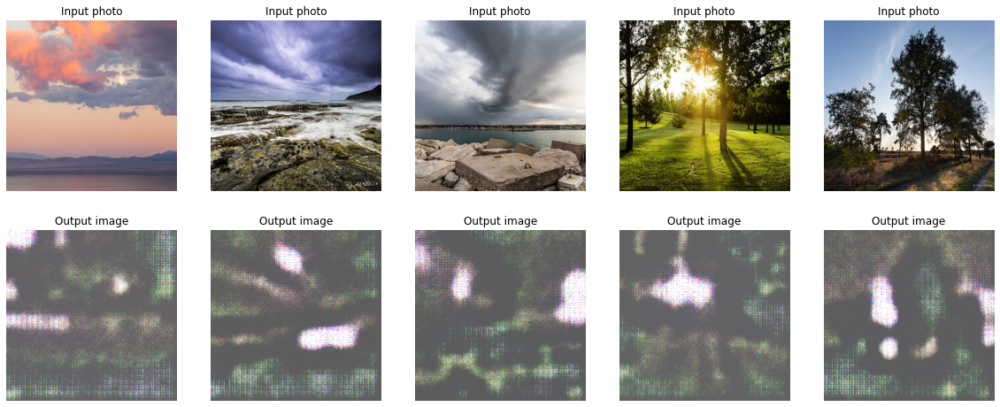

  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 6/40 | Generators Loss: 2.8837 | Discriminators Loss: 0.2430 | Last lr 0.00010388 | It took 5.517 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 7/40 | Generators Loss: 2.7820 | Discriminators Loss: 0.3811 | Last lr 0.00012875 | It took 5.513 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 8/40 | Generators Loss: 2.7978 | Discriminators Loss: 0.4974 | Last lr 0.00015193 | It took 5.512 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 9/40 | Generators Loss: 2.8975 | Discriminators Loss: 0.7013 | Last lr 0.00017184 | It took 5.445 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 10/40 | Generators Loss: 2.9774 | Discriminators Loss: 0.7521 | Last lr 0.00018712 | It took 5.435 mins
B -> A


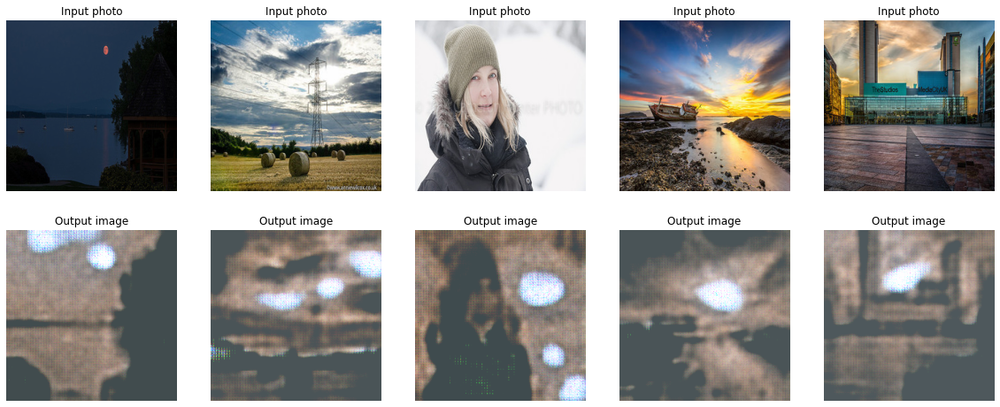

  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 11/40 | Generators Loss: 2.7576 | Discriminators Loss: 0.7608 | Last lr 0.00019672 | It took 5.422 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 12/40 | Generators Loss: 2.9794 | Discriminators Loss: 0.7931 | Last lr 0.00020000 | It took 5.419 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 13/40 | Generators Loss: 2.8817 | Discriminators Loss: 0.8030 | Last lr 0.00019937 | It took 5.425 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 14/40 | Generators Loss: 2.7982 | Discriminators Loss: 0.9249 | Last lr 0.00019749 | It took 5.420 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 15/40 | Generators Loss: 2.6810 | Discriminators Loss: 0.9330 | Last lr 0.00019439 | It took 5.415 mins
B -> A


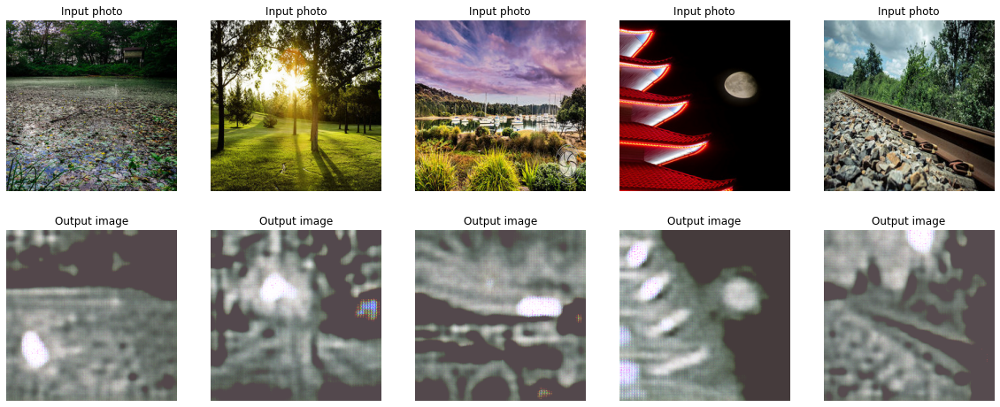

  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 16/40 | Generators Loss: 2.4719 | Discriminators Loss: 0.9677 | Last lr 0.00019010 | It took 5.422 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 17/40 | Generators Loss: 2.7288 | Discriminators Loss: 0.9780 | Last lr 0.00018467 | It took 5.418 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 18/40 | Generators Loss: 2.7514 | Discriminators Loss: 0.8933 | Last lr 0.00017818 | It took 5.428 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 19/40 | Generators Loss: 2.8142 | Discriminators Loss: 0.7768 | Last lr 0.00017071 | It took 5.420 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 20/40 | Generators Loss: 2.9277 | Discriminators Loss: 0.7663 | Last lr 0.00016235 | It took 5.411 mins
B -> A


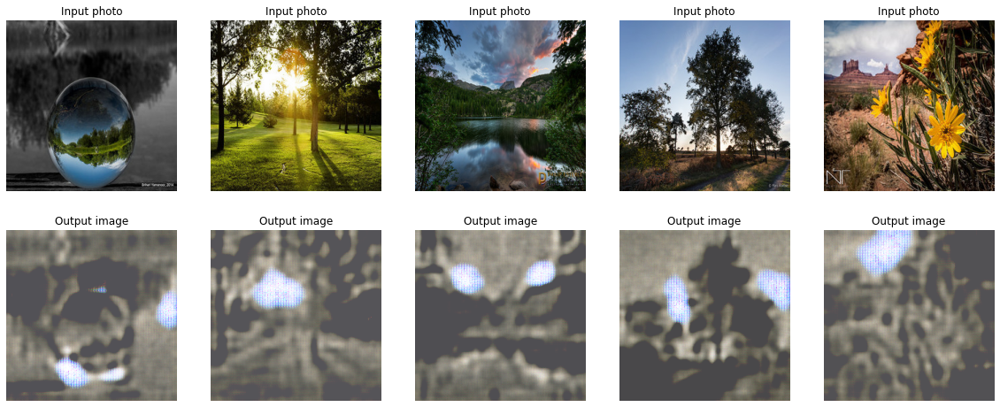

  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 21/40 | Generators Loss: 2.8167 | Discriminators Loss: 0.7924 | Last lr 0.00015320 | It took 5.418 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 22/40 | Generators Loss: 2.8692 | Discriminators Loss: 0.7652 | Last lr 0.00014339 | It took 5.426 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 23/40 | Generators Loss: 2.8078 | Discriminators Loss: 0.7788 | Last lr 0.00013303 | It took 5.416 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 24/40 | Generators Loss: 2.8263 | Discriminators Loss: 0.7767 | Last lr 0.00012225 | It took 5.415 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 25/40 | Generators Loss: 2.8462 | Discriminators Loss: 0.7940 | Last lr 0.00011120 | It took 5.419 mins
B -> A


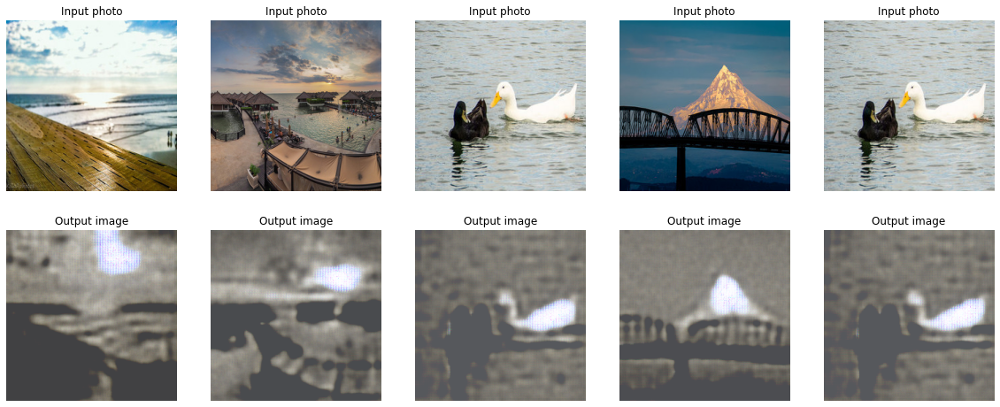

  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 26/40 | Generators Loss: 2.7806 | Discriminators Loss: 0.9972 | Last lr 0.00010000 | It took 5.422 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 27/40 | Generators Loss: 2.7263 | Discriminators Loss: 0.9716 | Last lr 0.00008880 | It took 5.417 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 28/40 | Generators Loss: 2.7318 | Discriminators Loss: 0.9333 | Last lr 0.00007775 | It took 5.423 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 29/40 | Generators Loss: 2.9847 | Discriminators Loss: 0.9503 | Last lr 0.00006697 | It took 5.417 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 30/40 | Generators Loss: 2.8745 | Discriminators Loss: 1.0128 | Last lr 0.00005661 | It took 5.412 mins
B -> A


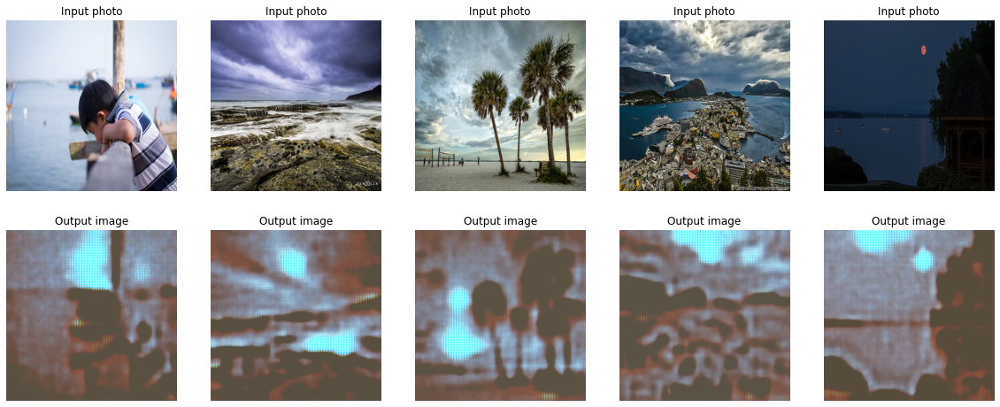

  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 31/40 | Generators Loss: 2.7776 | Discriminators Loss: 0.9776 | Last lr 0.00004680 | It took 5.417 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 32/40 | Generators Loss: 2.6464 | Discriminators Loss: 0.9124 | Last lr 0.00003765 | It took 5.431 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 33/40 | Generators Loss: 2.6310 | Discriminators Loss: 0.8339 | Last lr 0.00002929 | It took 5.420 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 34/40 | Generators Loss: 2.6098 | Discriminators Loss: 0.8468 | Last lr 0.00002182 | It took 5.496 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 35/40 | Generators Loss: 2.6212 | Discriminators Loss: 0.8720 | Last lr 0.00001533 | It took 5.491 mins
B -> A


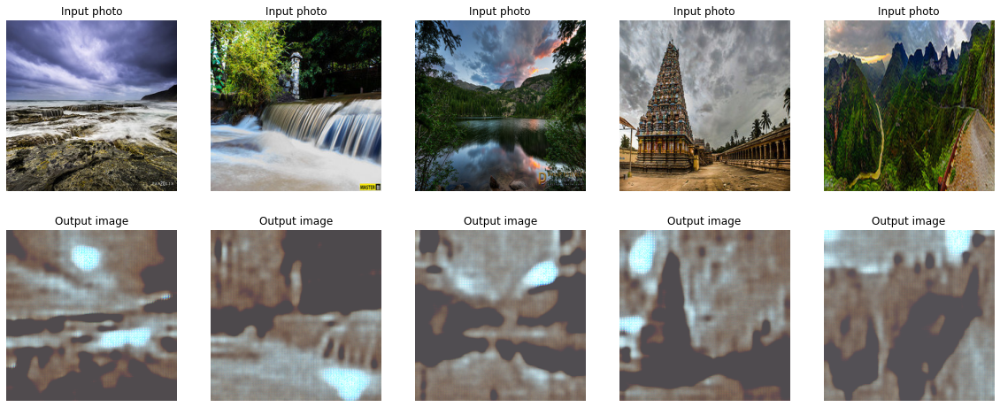

  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 36/40 | Generators Loss: 2.6473 | Discriminators Loss: 0.8999 | Last lr 0.00000990 | It took 5.491 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 37/40 | Generators Loss: 2.6412 | Discriminators Loss: 0.9534 | Last lr 0.00000561 | It took 5.490 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 38/40 | Generators Loss: 2.6273 | Discriminators Loss: 0.9249 | Last lr 0.00000251 | It took 5.494 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 39/40 | Generators Loss: 2.5811 | Discriminators Loss: 0.9461 | Last lr 0.00000063 | It took 5.496 mins


  0%|          | 0/105 [00:00<?, ?it/s]

Epoch: 40/40 | Generators Loss: 2.5707 | Discriminators Loss: 0.8564 | Last lr 0.00000000 | It took 5.494 mins
B -> A


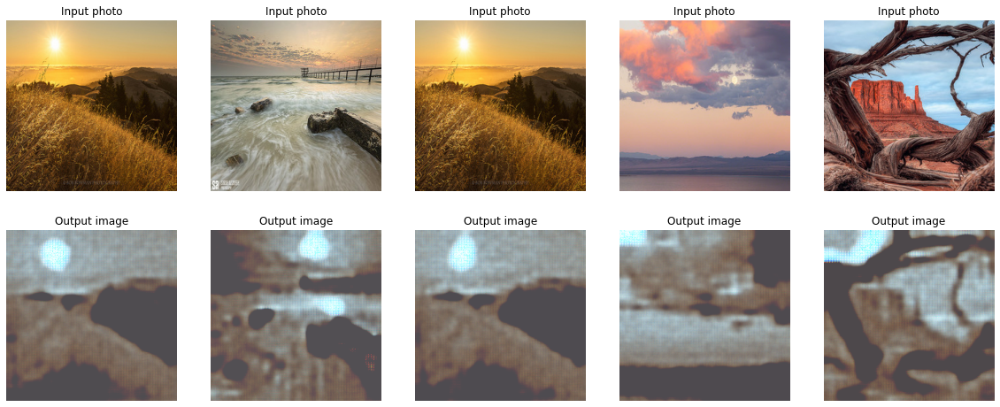

Training took 218.3912 minutes


In [ ]:
fit(num_epochs, train_dl, test_dl,
    generator_cezanne2photo, generator_photo2cezanne,
    discriminator_cezanne, discriminator_photo,
    lr, buffer_cezanne, buffer_photo, history, save=True)

In [ ]:
def translate_batch(dl, gen_a2b, gen_b2a):
  for a, b in test_dl:
    fake_b = gen_a2b(a.to(device)).detach().cpu()
    fake_a = gen_b2a(b.to(device)).detach().cpu()
    break
  plt.figure(figsize=(20,9))
  plt.imshow(make_grid(denorm(b), nrow=batch_size).permute(1, 2, 0))
  plt.axis('off')
  plt.title('B -> A')
  plt.figure(figsize=(20,9))
  plt.imshow(make_grid(denorm(fake_a), nrow=batch_size).permute(1, 2, 0))
  plt.axis('off')

  plt.figure(figsize=(20,9))
  plt.imshow(make_grid(denorm(a), nrow=batch_size).permute(1, 2, 0))
  plt.axis('off')
  plt.title('A -> B')
  plt.figure(figsize=(20,9))
  plt.imshow(make_grid(denorm(fake_b), nrow=batch_size).permute(1, 2, 0))
  plt.axis('off')


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:566: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


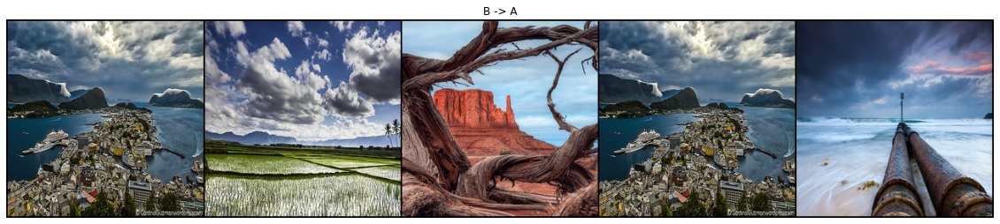

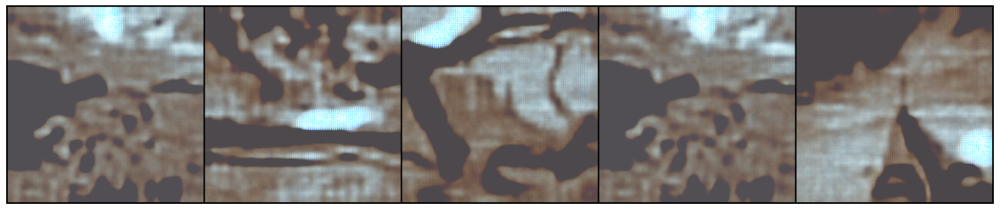

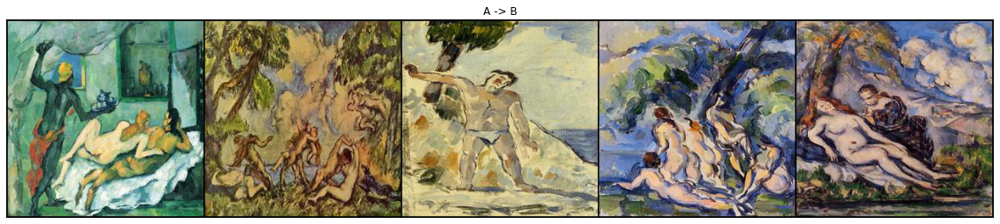

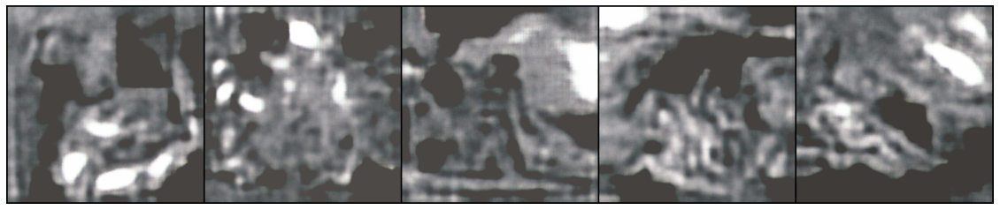

In [ ]:
translate_batch(test_dl, generator_cezanne2photo, generator_photo2cezanne)

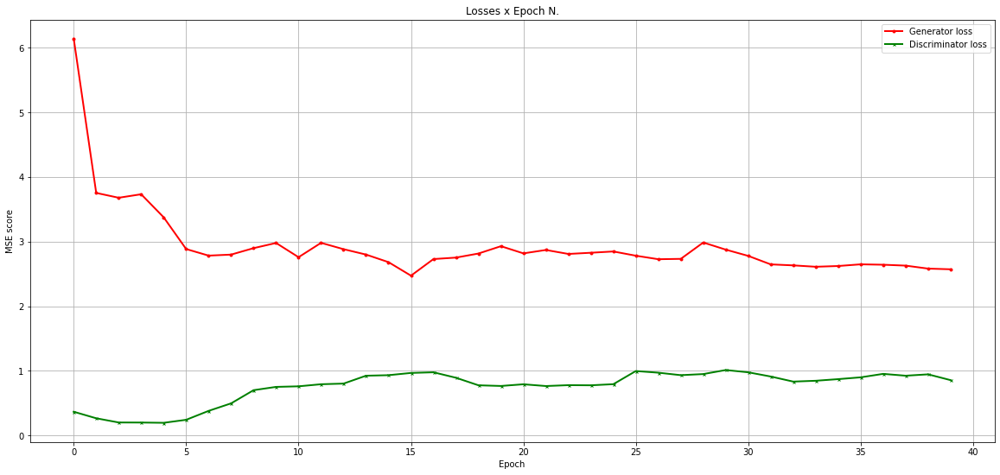

In [ ]:
history.plot_losses()

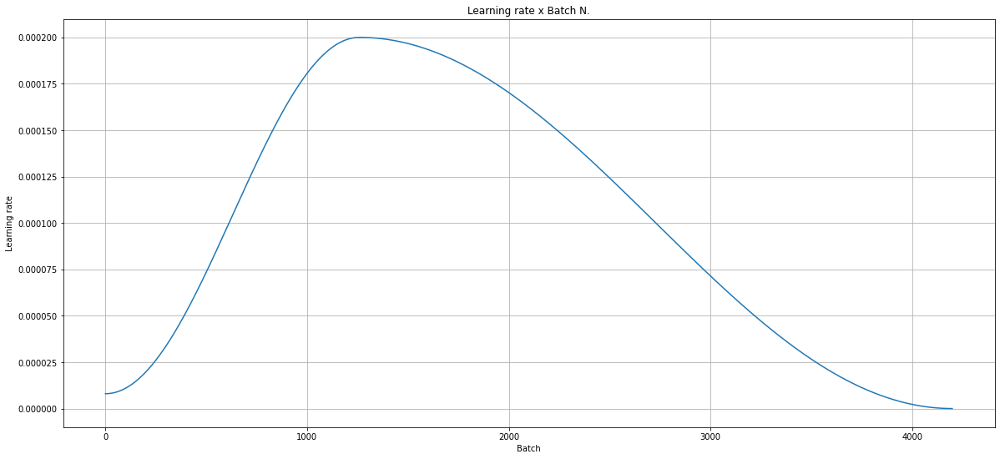

In [ ]:
history.plot_lrs()

In [ ]:
!cp -f '/content/discr_a.pth' '/content/drive/MyDrive/kaggle competitions/cycle-GANs/cezanne-cycle-gan/'
!cp -f '/content/discr_b.pth' '/content/drive/MyDrive/kaggle competitions/cycle-GANs/cezanne-cycle-gan/'

!cp -f '/content/gen_a2b.pth' '/content/drive/MyDrive/kaggle competitions/cycle-GANs/cezanne-cycle-gan/'
!cp -f '/content/gen_b2a.pth' '/content/drive/MyDrive/kaggle competitions/cycle-GANs/cezanne-cycle-gan/'